In [1]:
!pip install -q pandas seaborn scikit-plot scikit-image wandb torch-summary plotly umap-learn dotmap einops kornia opencv-python xgboost

In [2]:
!pip3 install -q torchvision # restart kernel

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.12.1 requires typing-extensions<4.6.0,>=3.6.6, but you have typing-extensions 4.12.0 which is incompatible.


In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import torch
from train import train_model
import wandb

TRACK = False
if TRACK:
    wandb.login()

# Classifier

Loaded features from SCIN/embeddings/features_32.npy
Loaded scores from SCIN/embeddings/scores_32.npy
Training for criteria: Background
Training for criteria: Lighting
Training for criteria: Focus
Training for criteria: Orientation
Training for criteria: Color Calibration
Training for criteria: Resolution
Training for criteria: Field of View


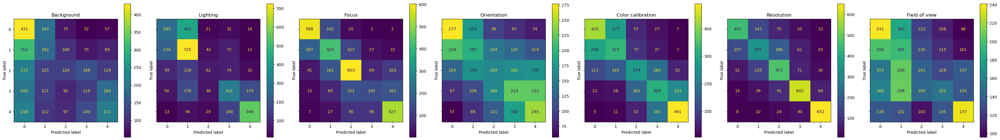

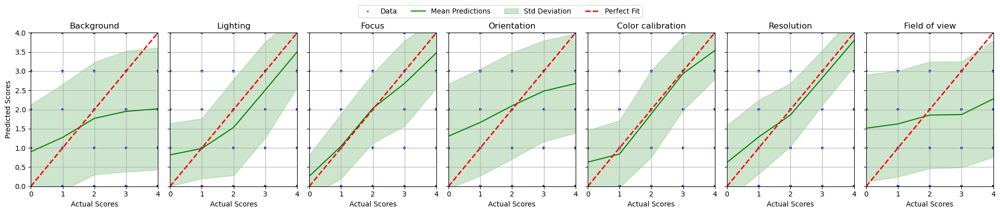


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     27.16      |    27.61     |   0.2762   |   0.2685   |
     Lighting      |     47.50      |    45.54     |   0.7076   |   0.6748   |
      Focus        |     58.09      |    58.24     |   0.7888   |   0.7953   |
   Orientation     |     28.83      |    29.35     |   0.3423   |   0.3416   |
Color calibration  |     47.77      |    48.03     |   0.7659   |   0.7622   |
    Resolution     |     65.94      |    66.31     |   0.7937   |   0.7970   |
  Field of view    |     25.51      |    25.55     |   0.1719   |   0.1701   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.9053   |   1.8791   |     43.89      |    43.90     |   0.5438   |   0.5398   |


In [24]:
classifier = train_model('SCIN', num_distortions=32, crop=False, batch_size=10, num_workers=1, model_type='cls', track=TRACK)

Loaded features from SCIN/embeddings/features_32.npy
Loaded scores from SCIN/embeddings/scores_32.npy
Training for criteria: Background
Training for criteria: Lighting
Training for criteria: Focus
Training for criteria: Orientation
Training for criteria: Color Calibration
Training for criteria: Resolution
Training for criteria: Field of View


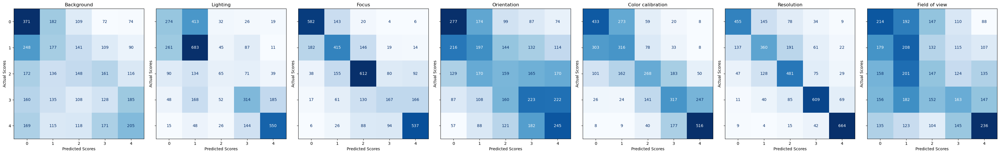

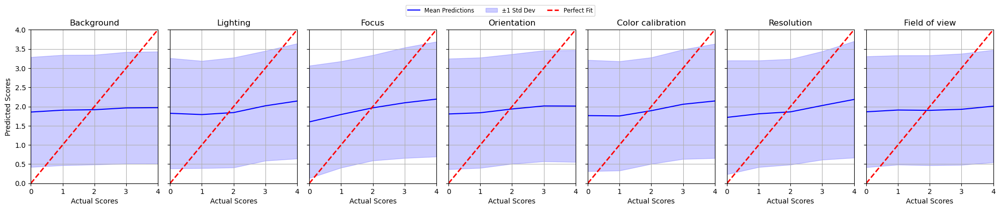


     Criteria      |    MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
----------------------------------------------------------------------------
    Background     |   1.3508   |  -0.5583   |   0.2548   |     0.2528     |
     Lighting      |   0.7168   |   0.3998   |   0.6688   |     0.6994     |
      Focus        |   0.5166   |   0.5756   |   0.7985   |     0.7928     |
   Orientation     |   1.2113   |  -0.3782   |   0.3416   |     0.3417     |
Color calibration  |   0.6397   |   0.5283   |   0.7695   |     0.7737     |
    Resolution     |   0.4466   |   0.6111   |   0.8096   |     0.8041     |
  Field of view    |   1.4037   |  -0.6854   |   0.1700   |     0.1726     |

   MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
-------------------------------------------------------
  0.8979   |   0.0712   |   0.5439   |     0.5465     |


In [25]:
classifier = train_model('SCIN', num_distortions=32, crop=False, batch_size=10, num_workers=1, model_type='xgb_cls', track=TRACK)

In [38]:
classifier = train_model('SCIN', num_distortions=4, crop=False, batch_size=10, num_workers=1, model_type='xgb_cls', track=TRACK)

Loaded features from SCIN/embeddings/features_4.npy
Loaded scores from SCIN/embeddings/scores_4.npy


XGBoostError: [19:18:49] /workspace/include/xgboost/objective.h:104: multioutput is not supported by current objective function
Stack trace:
  [bt] (0) /opt/conda/lib/python3.11/site-packages/xgboost/lib/libxgboost.so(+0x48c70a) [0x7f5a8475970a]
  [bt] (1) /opt/conda/lib/python3.11/site-packages/xgboost/lib/libxgboost.so(+0x4bfee7) [0x7f5a8478cee7]
  [bt] (2) /opt/conda/lib/python3.11/site-packages/xgboost/lib/libxgboost.so(+0x4ccd7d) [0x7f5a84799d7d]
  [bt] (3) /opt/conda/lib/python3.11/site-packages/xgboost/lib/libxgboost.so(+0x4c5268) [0x7f5a84792268]
  [bt] (4) /opt/conda/lib/python3.11/site-packages/xgboost/lib/libxgboost.so(XGBoosterUpdateOneIter+0x70) [0x7f5a8442eef0]
  [bt] (5) /opt/conda/lib/python3.11/lib-dynload/../../libffi.so.8(+0x6a4a) [0x7f5fc56fda4a]
  [bt] (6) /opt/conda/lib/python3.11/lib-dynload/../../libffi.so.8(+0x5fea) [0x7f5fc56fcfea]
  [bt] (7) /opt/conda/lib/python3.11/lib-dynload/_ctypes.cpython-311-x86_64-linux-gnu.so(+0x12529) [0x7f5fc5715529]
  [bt] (8) /opt/conda/lib/python3.11/lib-dynload/_ctypes.cpython-311-x86_64-linux-gnu.so(+0x8862) [0x7f5fc570b862]



Loaded features from F17K/embeddings/features_64.npy
Loaded scores from F17K/embeddings/scores_64.npy
Training for criteria: Background
Training for criteria: Lighting
Training for criteria: Focus
Training for criteria: Orientation
Training for criteria: Color Calibration
Training for criteria: Resolution
Training for criteria: Field of View


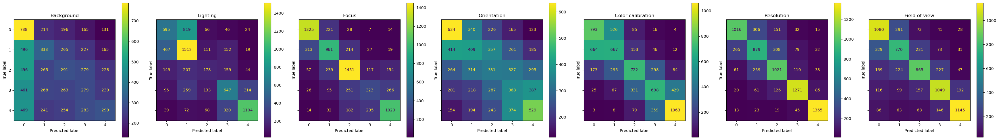

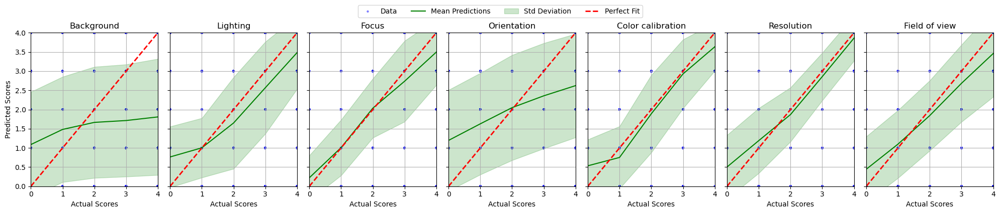


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     25.66      |    26.38     |   0.1614   |   0.1620   |
     Lighting      |     50.23      |    48.59     |   0.7301   |   0.6974   |
      Focus        |     64.34      |    64.04     |   0.8250   |   0.8338   |
   Orientation     |     29.62      |    30.00     |   0.3502   |   0.3507   |
Color calibration  |     51.85      |    52.04     |   0.8115   |   0.8102   |
    Resolution     |     73.17      |    73.23     |   0.8480   |   0.8483   |
  Field of view    |     64.72      |    64.50     |   0.7443   |   0.7432   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.7464   |   1.5047   |     52.42      |    52.23     |   0.6323   |   0.6281   |


In [28]:
classifier = train_model('F17K', num_distortions=64, crop=False, batch_size=10, num_workers=1, model_type='cls', track=TRACK)

In [29]:
import pickle

with open("f17k_cls.pkl", "wb") as f:
    pickle.dump(classifier, f)

# Regression

Using cache found in /home/jovyan/.cache/torch/hub/miccunifi_ARNIQA_main


Saved features to test/embeddings/features_1.npy
Saved scores to test/embeddings/scores_1.npy


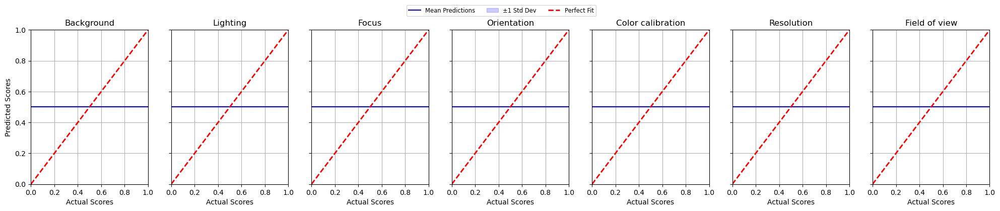

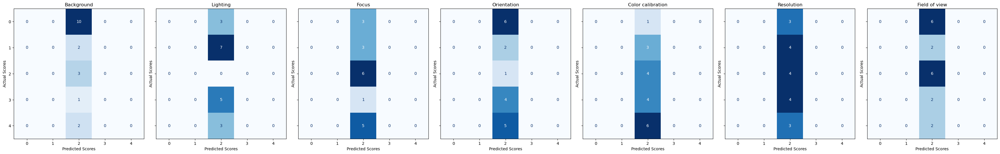


     Criteria      |    MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
----------------------------------------------------------------------------
    Background     |   1.5000   |  -0.4595   |    nan     |     0.0000     |
     Lighting      |   1.3333   |  -0.0062   |    nan     |     0.0000     |
      Focus        |   1.1111   |  -0.0062   |    nan     |     0.0000     |
   Orientation     |   1.5556   |   0.0000   |    nan     |     0.0000     |
Color calibration  |   1.1667   |  -0.2377   |    nan     |     0.0000     |
    Resolution     |   1.1111   |   0.0000   |    nan     |     0.0000     |
  Field of view    |   1.1111   |  -0.1096   |    nan     |     0.0000     |

   MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
-------------------------------------------------------
  1.2698   |  -0.0057   |    nan     |     0.0000     |


In [6]:
regressor = train_model('test', num_distortions=1, crop=False, batch_size=10, num_workers=1, model_type='xgb_reg', track=TRACK)

Loaded features from combined/embeddings/features_16.npy
Loaded scores from combined/embeddings/scores_16.npy
Training for criteria: Background
Training for criteria: Lighting
Training for criteria: Focus
Training for criteria: Orientation
Training for criteria: Color Calibration
Training for criteria: Resolution
Training for criteria: Field of View


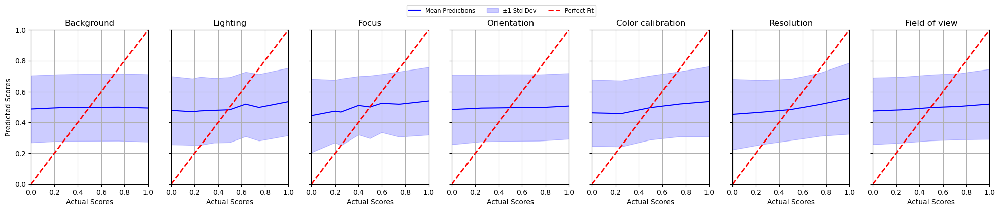

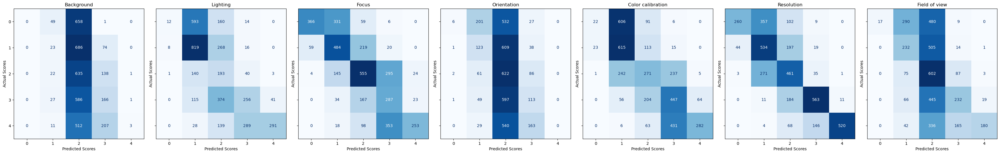


     Criteria      |    MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
----------------------------------------------------------------------------
    Background     |   1.1234   |   0.0603   |   0.2636   |     0.1451     |
     Lighting      |   0.7229   |   0.5143   |   0.7017   |     0.6679     |
      Focus        |   0.5637   |   0.6159   |   0.7929   |     0.7708     |
   Orientation     |   1.1082   |   0.0859   |   0.2987   |     0.1865     |
Color calibration  |   0.6363   |   0.6096   |   0.7871   |     0.7498     |
    Resolution     |   0.4453   |   0.7067   |   0.8377   |     0.8289     |
  Field of view    |   0.9316   |   0.2551   |   0.4942   |     0.4172     |

   MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
-------------------------------------------------------
  0.7902   |   0.4078   |   0.6340   |     0.5822     |


In [18]:
regressor = train_model('combined', num_distortions=16, crop=False, batch_size=10, num_workers=1, model_type='xgb_reg', track=TRACK)

Loaded features from combined/embeddings/features_16.npy
Loaded scores from combined/embeddings/scores_16.npy
[0]	validation_0-mphe:0.05856
[1]	validation_0-mphe:0.05661
[2]	validation_0-mphe:0.05491
[3]	validation_0-mphe:0.05341
[4]	validation_0-mphe:0.05204
[5]	validation_0-mphe:0.05081
[6]	validation_0-mphe:0.04968
[7]	validation_0-mphe:0.04866
[8]	validation_0-mphe:0.04775
[9]	validation_0-mphe:0.04693
[10]	validation_0-mphe:0.04621
[11]	validation_0-mphe:0.04550
[12]	validation_0-mphe:0.04487
[13]	validation_0-mphe:0.04429
[14]	validation_0-mphe:0.04375
[15]	validation_0-mphe:0.04323
[16]	validation_0-mphe:0.04275
[17]	validation_0-mphe:0.04230
[18]	validation_0-mphe:0.04192
[19]	validation_0-mphe:0.04152
[20]	validation_0-mphe:0.04118
[21]	validation_0-mphe:0.04086
[22]	validation_0-mphe:0.04054
[23]	validation_0-mphe:0.04025
[24]	validation_0-mphe:0.03998
[25]	validation_0-mphe:0.03974
[26]	validation_0-mphe:0.03949
[27]	validation_0-mphe:0.03927
[28]	validation_0-mphe:0.03907
[

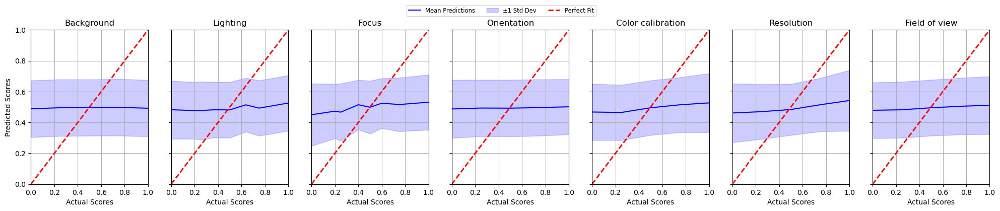

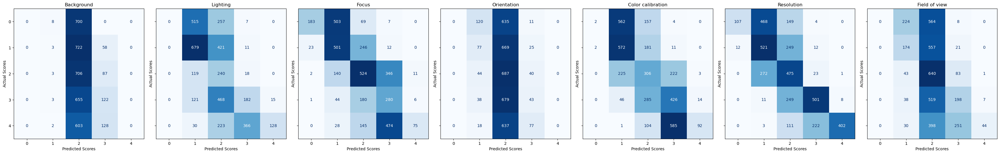


     Criteria      |    MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
----------------------------------------------------------------------------
    Background     |   1.1413   |   0.0340   |   0.1971   |     0.0847     |
     Lighting      |   0.8571   |   0.4093   |   0.6264   |     0.5521     |
      Focus        |   0.6821   |   0.5312   |   0.7426   |     0.6849     |
   Orientation     |   1.1542   |   0.0387   |   0.2036   |     0.0976     |
Color calibration  |   0.7192   |   0.5497   |   0.7531   |     0.6808     |
    Resolution     |   0.5505   |   0.6362   |   0.7975   |     0.7668     |
  Field of view    |   1.0111   |   0.1939   |   0.4438   |     0.3114     |

   MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
-------------------------------------------------------
  0.8736   |   0.3426   |   0.5845   |     0.4929     |


In [22]:
regressor = train_model('combined', num_distortions=16, crop=False, batch_size=10, num_workers=1, model_type='xgb_reg', track=TRACK)

Loaded features from combined/embeddings/features_16.npy
Loaded scores from combined/embeddings/scores_16.npy
[0]	validation_0-mphe:0.05735
[1]	validation_0-mphe:0.05449
[2]	validation_0-mphe:0.05198
[3]	validation_0-mphe:0.04984
[4]	validation_0-mphe:0.04798
[5]	validation_0-mphe:0.04636
[6]	validation_0-mphe:0.04493
[7]	validation_0-mphe:0.04367
[8]	validation_0-mphe:0.04255
[9]	validation_0-mphe:0.04154
[10]	validation_0-mphe:0.04065
[11]	validation_0-mphe:0.03990
[12]	validation_0-mphe:0.03920
[13]	validation_0-mphe:0.03857
[14]	validation_0-mphe:0.03802
[15]	validation_0-mphe:0.03756
[16]	validation_0-mphe:0.03712
[17]	validation_0-mphe:0.03671
[18]	validation_0-mphe:0.03635
[19]	validation_0-mphe:0.03605
[20]	validation_0-mphe:0.03576
[21]	validation_0-mphe:0.03548
[22]	validation_0-mphe:0.03524
[23]	validation_0-mphe:0.03504
[24]	validation_0-mphe:0.03483
[25]	validation_0-mphe:0.03465
[26]	validation_0-mphe:0.03449
[27]	validation_0-mphe:0.03433
[28]	validation_0-mphe:0.03419
[

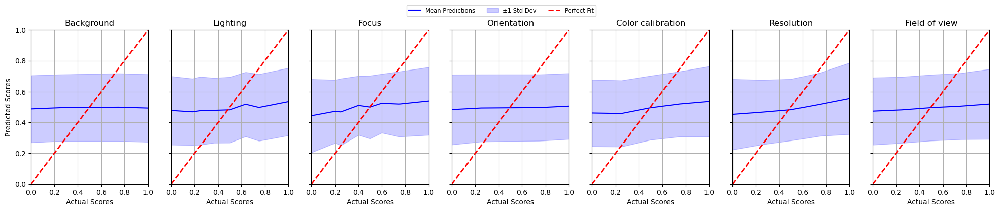

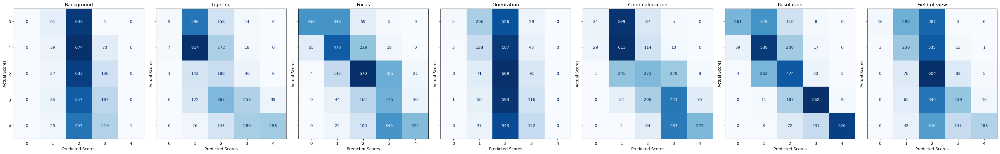


     Criteria      |    MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
----------------------------------------------------------------------------
    Background     |   1.1161   |   0.0589   |   0.2636   |     0.1501     |
     Lighting      |   0.7250   |   0.5128   |   0.6998   |     0.6669     |
      Focus        |   0.5747   |   0.6056   |   0.7864   |     0.7637     |
   Orientation     |   1.1126   |   0.0754   |   0.2847   |     0.1808     |
Color calibration  |   0.6305   |   0.6188   |   0.7939   |     0.7572     |
    Resolution     |   0.4411   |   0.7076   |   0.8379   |     0.8290     |
  Field of view    |   0.9276   |   0.2589   |   0.4979   |     0.4211     |

   MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
-------------------------------------------------------
  0.7897   |   0.4065   |   0.6325   |     0.5818     |


In [23]:
regressor = train_model('combined', num_distortions=16, crop=False, batch_size=10, num_workers=1, model_type='xgb_reg', track=TRACK)

In [7]:
import pickle

with open("combined_reg.pkl", "wb") as f:
    pickle.dump(regressor, f)

# MLP Regressor

Loaded features from combined/embeddings/features_64.npy
Loaded scores from combined/embeddings/scores_64.npy


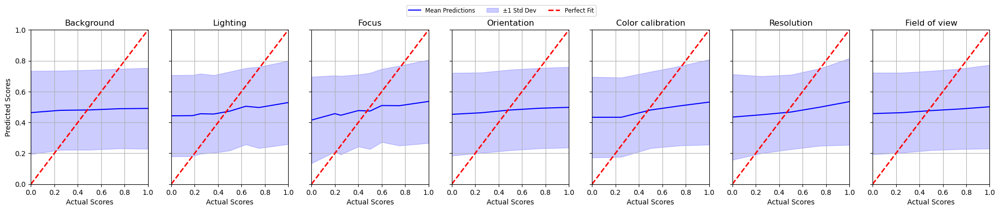

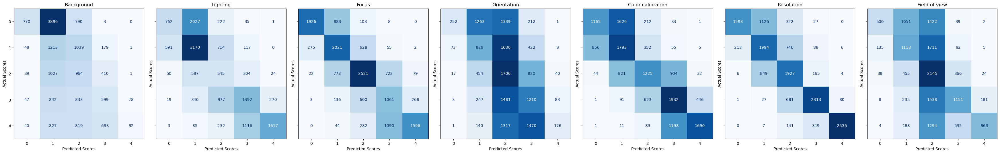


     Criteria      |    MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
----------------------------------------------------------------------------
    Background     |   1.0597   |   0.2024   |   0.4662   |     0.3878     |
     Lighting      |   0.5914   |   0.6279   |   0.7797   |     0.7809     |
      Focus        |   0.4516   |   0.7061   |   0.8466   |     0.8372     |
   Orientation     |   0.9961   |   0.2141   |   0.4700   |     0.4024     |
Color calibration  |   0.5275   |   0.6899   |   0.8359   |     0.8316     |
    Resolution     |   0.3624   |   0.7732   |   0.8782   |     0.8746     |
  Field of view    |   0.8504   |   0.3155   |   0.5558   |     0.5180     |

   MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
-------------------------------------------------------
  0.6913   |   0.5031   |   0.7086   |     0.6898     |


In [4]:
mlp = train_model('combined', num_distortions=64, crop=False, batch_size=10, num_workers=1, model_type='mlp_reg', track=TRACK)

In [6]:
import pickle

with open("combined_mlp_reg.pkl", "wb") as f:
    pickle.dump(mlp, f)

# Test own labeled data

In [4]:
import pickle
with open("combined_mlp_reg.pkl", "rb") as f:
    mlp = pickle.load(f)

Loaded features from F17K/embeddings/features_2.npy
Loaded scores from F17K/embeddings/scores_2.npy


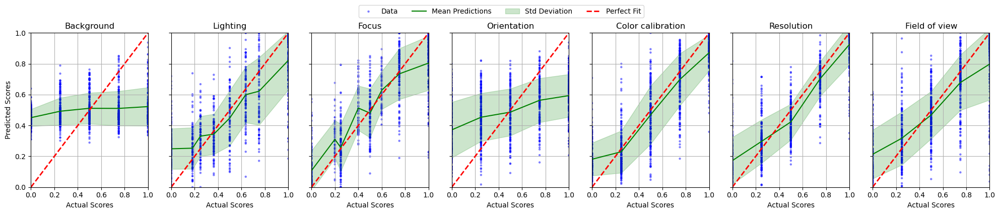


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     32.13      |    19.83     |   0.1557   |   0.1547   |
     Lighting      |     48.90      |    42.31     |   0.7521   |   0.7378   |
      Focus        |     60.37      |    56.93     |   0.8278   |   0.8336   |
   Orientation     |     45.38      |    25.89     |   0.4111   |   0.4035   |
Color calibration  |     55.32      |    52.09     |   0.8292   |   0.8317   |
    Resolution     |     71.77      |    67.11     |   0.8740   |   0.8716   |
  Field of view    |     60.27      |    55.30     |   0.7526   |   0.7506   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.6925   |   1.0191   |     55.27      |    45.74     |   0.7008   |   0.6966   |


In [11]:
from test import test
# F17K regressor!
test('F17K', crop=False, batch_size=10, num_workers=1, model=regressor, model_type='reg')

Loaded features from SCIN/embeddings/features_4.npy
Loaded scores from SCIN/embeddings/scores_4.npy


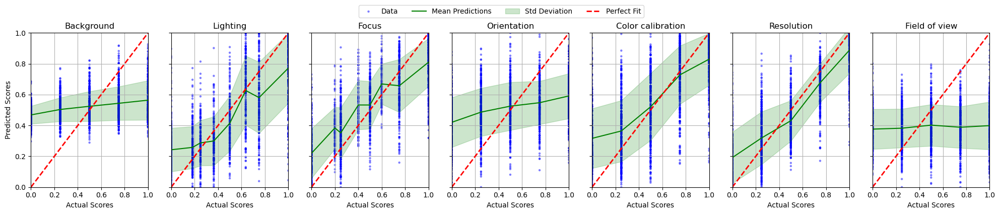


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     27.39      |    20.94     |   0.2888   |   0.2898   |
     Lighting      |     44.41      |    39.56     |   0.6988   |   0.6868   |
      Focus        |     54.55      |    44.56     |   0.7531   |   0.7582   |
   Orientation     |     35.49      |    22.64     |   0.3122   |   0.3102   |
Color calibration  |     41.76      |    38.70     |   0.6862   |   0.6905   |
    Resolution     |     62.92      |    56.23     |   0.8217   |   0.8212   |
  Field of view    |     35.27      |    21.01     |   0.0372   |   0.0392   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.8868   |   1.4290   |     46.33      |    35.21     |   0.5511   |   0.5399   |


In [12]:
from test import test
# F17K regressor!
test('SCIN', crop=False, batch_size=10, num_workers=1, model=regressor, model_type='reg')

Loaded features from SCIN/embeddings/features_4.npy
Loaded scores from SCIN/embeddings/scores_4.npy


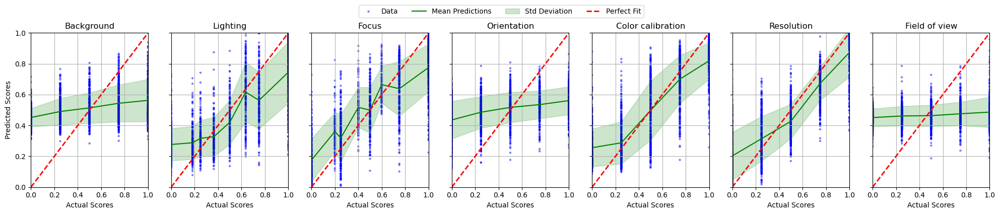


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     34.81      |    22.78     |   0.3051   |   0.3065   |
     Lighting      |     46.30      |    39.43     |   0.7148   |   0.7067   |
      Focus        |     58.08      |    48.50     |   0.7720   |   0.7811   |
   Orientation     |     34.64      |    22.26     |   0.3169   |   0.3163   |
Color calibration  |     48.90      |    42.03     |   0.7880   |   0.7916   |
    Resolution     |     67.14      |    58.85     |   0.8352   |   0.8353   |
  Field of view    |     34.79      |    20.72     |   0.0907   |   0.0853   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.8350   |   1.2604   |     54.87      |    36.94     |   0.6068   |   0.6010   |


In [14]:
from test import test
# Combined regressor!
test('SCIN', crop=False, batch_size=10, num_workers=1, model=regressor, model_type='reg')

Loaded features from F17K/embeddings/features_4.npy
Loaded scores from F17K/embeddings/scores_4.npy


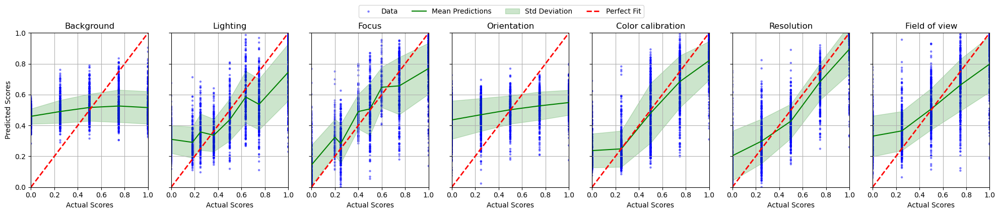


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     33.52      |    21.11     |   0.1962   |   0.1969   |
     Lighting      |     44.77      |    37.66     |   0.6975   |   0.6885   |
      Focus        |     60.15      |    52.61     |   0.7897   |   0.7961   |
   Orientation     |     29.81      |    22.63     |   0.3100   |   0.3097   |
Color calibration  |     51.91      |    43.96     |   0.7923   |   0.7975   |
    Resolution     |     69.31      |    62.78     |   0.8393   |   0.8355   |
  Field of view    |     56.71      |    47.15     |   0.7192   |   0.7179   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.7628   |   1.1270   |     56.88      |    41.15     |   0.6608   |   0.6575   |


In [15]:
from test import test
# Combined regressor!
test('F17K', crop=False, batch_size=10, num_workers=1, model=regressor, model_type='reg')

Loaded features from F17K/embeddings/features_4.npy
Loaded scores from F17K/embeddings/scores_4.npy


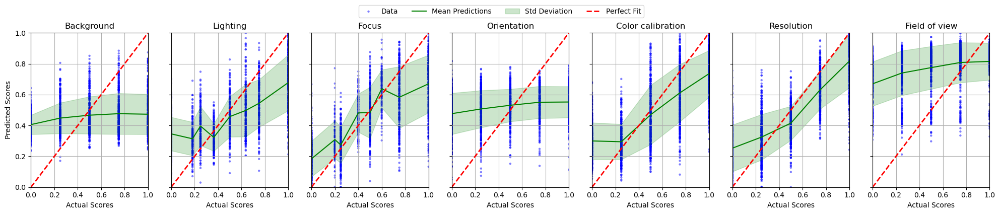


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     14.29      |    21.50     |   0.1442   |   0.1362   |
     Lighting      |     44.55      |    33.55     |   0.6121   |   0.5989   |
      Focus        |     51.90      |    40.86     |   0.7044   |   0.7165   |
   Orientation     |     24.22      |    23.15     |   0.1987   |   0.1954   |
Color calibration  |     41.88      |    35.83     |   0.6927   |   0.7034   |
    Resolution     |     59.31      |    48.34     |   0.7722   |   0.7734   |
  Field of view    |     18.26      |    20.89     |   0.3113   |   0.3157   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.9573   |   1.5973   |     44.00      |    31.98     |   0.4824   |   0.4770   |


In [18]:
from test import test
# SCIN regressor!
test('F17K', crop=False, batch_size=10, num_workers=1, model=regressor, model_type='reg')

Loaded features from SCIN/embeddings/features_4.npy
Loaded scores from SCIN/embeddings/scores_4.npy


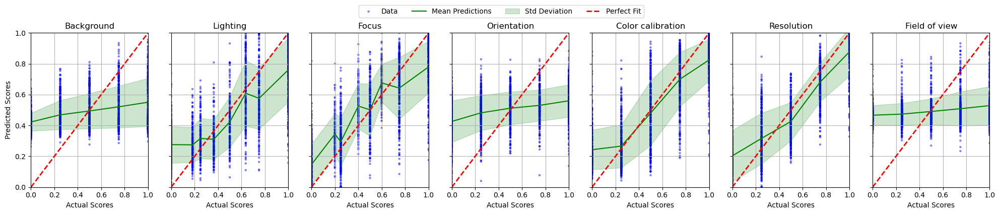


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     27.63      |    21.67     |   0.3180   |   0.3177   |
     Lighting      |     46.93      |    39.30     |   0.7071   |   0.6994   |
      Focus        |     56.12      |    48.72     |   0.7783   |   0.7874   |
   Orientation     |     49.88      |    21.82     |   0.3077   |   0.3063   |
Color calibration  |     48.22      |    43.36     |   0.7770   |   0.7805   |
    Resolution     |     63.52      |    56.27     |   0.8206   |   0.8208   |
  Field of view    |     26.11      |    21.22     |   0.1851   |   0.1804   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.8369   |   1.2608   |     50.84      |    36.45     |   0.6081   |   0.6032   |


In [19]:
from test import test
# SCIN regressor!
test('SCIN', crop=False, batch_size=10, num_workers=1, model=regressor, model_type='reg')

Loaded features from SCIN/embeddings/features_4.npy
Loaded scores from SCIN/embeddings/scores_4.npy


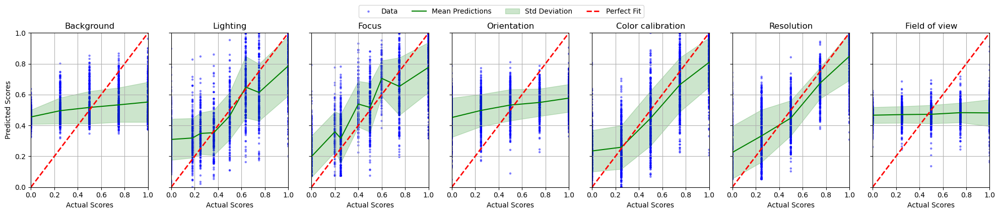


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     34.38      |    21.49     |   0.2657   |   0.2656   |
     Lighting      |     47.08      |    40.07     |   0.7083   |   0.6978   |
      Focus        |     51.69      |    44.07     |   0.7499   |   0.7613   |
   Orientation     |     49.61      |    21.74     |   0.3177   |   0.3153   |
Color calibration  |     47.79      |    42.73     |   0.7790   |   0.7867   |
    Resolution     |     63.63      |    55.37     |   0.8071   |   0.8117   |
  Field of view    |     31.57      |    20.30     |   0.0191   |   0.0121   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.8611   |   1.3039   |     50.20      |    35.43     |   0.5902   |   0.5879   |


In [22]:
from test import test
# Combined mlp!
test('SCIN', crop=False, batch_size=10, num_workers=1, model=mlp, model_type='mlp')

Loaded features from F17K/embeddings/features_4.npy
Loaded scores from F17K/embeddings/scores_4.npy


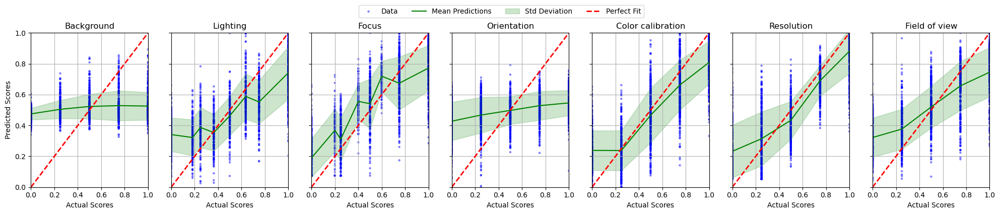


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     33.90      |    20.88     |   0.1856   |   0.1853   |
     Lighting      |     45.16      |    35.82     |   0.6822   |   0.6774   |
      Focus        |     52.07      |    43.60     |   0.7782   |   0.7882   |
   Orientation     |     26.87      |    23.69     |   0.3029   |   0.3051   |
Color calibration  |     48.74      |    43.89     |   0.7817   |   0.7934   |
    Resolution     |     62.86      |    57.14     |   0.8173   |   0.8168   |
  Field of view    |     54.97      |    41.99     |   0.7066   |   0.7118   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.7979   |   1.1594   |     51.74      |    37.93     |   0.6486   |   0.6523   |


In [23]:
from test import test
# Combined mlp!
test('F17K', crop=False, batch_size=10, num_workers=1, model=mlp, model_type='mlp')

Loaded features from F17K/embeddings/features_4.npy
Loaded scores from F17K/embeddings/scores_4.npy


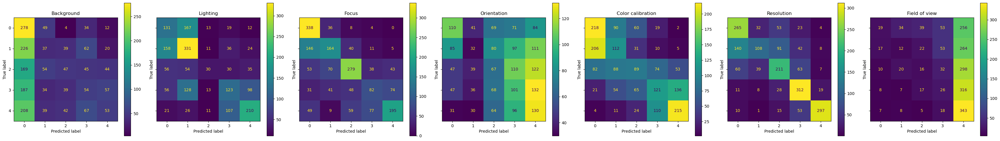


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     24.00      |    24.80     |   0.1844   |   0.1775   |
     Lighting      |     42.17      |    39.49     |   0.5823   |   0.5484   |
      Focus        |     54.10      |    54.00     |   0.6893   |   0.6922   |
   Orientation     |     23.06      |    23.60     |   0.1897   |   0.1794   |
Color calibration  |     38.85      |    39.88     |   0.6970   |   0.6930   |
    Resolution     |     63.39      |    63.02     |   0.7657   |   0.7752   |
  Field of view    |     19.93      |    21.85     |   0.1963   |   0.2236   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  1.1051   |   2.5786   |     38.82      |    38.84     |   0.4283   |   0.4234   |


In [26]:
from test import test
# SCIN cls!
test('F17K', crop=False, batch_size=10, num_workers=1, model=classifier, model_type='cls')

Loaded features from SCIN/embeddings/features_4.npy
Loaded scores from SCIN/embeddings/scores_4.npy


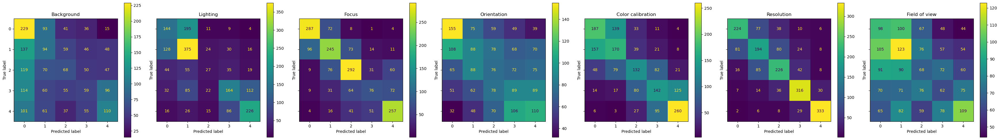


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     28.51      |    28.92     |   0.2795   |   0.2688   |
     Lighting      |     45.67      |    44.18     |   0.6803   |   0.6462   |
      Focus        |     59.04      |    59.03     |   0.7793   |   0.7887   |
   Orientation     |     27.01      |    27.37     |   0.2978   |   0.2980   |
Color calibration  |     46.43      |    46.71     |   0.7544   |   0.7497   |
    Resolution     |     67.85      |    67.94     |   0.8243   |   0.8273   |
  Field of view    |     24.06      |    24.04     |   0.1738   |   0.1700   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.9130   |   1.9058   |     43.65      |    43.63     |   0.5365   |   0.5314   |


In [27]:
from test import test
# SCIN cls!
test('SCIN', crop=False, batch_size=10, num_workers=1, model=classifier, model_type='cls')

Loaded features from F17K/embeddings/features_4.npy
Loaded scores from F17K/embeddings/scores_4.npy


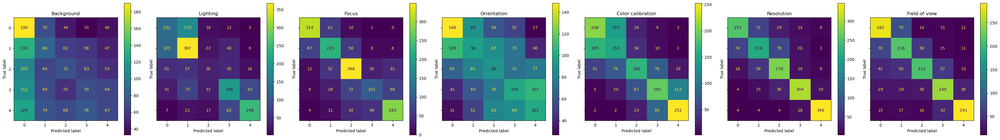


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     24.72      |    25.52     |   0.1467   |   0.1494   |
     Lighting      |     48.40      |    47.04     |   0.7080   |   0.6814   |
      Focus        |     65.45      |    64.84     |   0.8218   |   0.8269   |
   Orientation     |     28.13      |    28.27     |   0.3332   |   0.3341   |
Color calibration  |     51.24      |    51.22     |   0.7968   |   0.7937   |
    Resolution     |     73.41      |    73.54     |   0.8420   |   0.8424   |
  Field of view    |     65.96      |    65.67     |   0.7452   |   0.7431   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.7610   |   1.5444   |     52.01      |    51.79     |   0.6218   |   0.6185   |


In [30]:
from test import test
# F17K cls!
test('F17K', crop=False, batch_size=10, num_workers=1, model=classifier, model_type='cls')

Loaded features from SCIN/embeddings/features_4.npy
Loaded scores from SCIN/embeddings/scores_4.npy


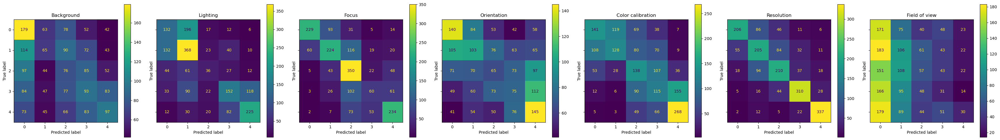


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     26.35      |    26.50     |   0.2281   |   0.2288   |
     Lighting      |     45.30      |    43.64     |   0.6691   |   0.6346   |
      Focus        |     57.09      |    54.92     |   0.7221   |   0.7329   |
   Orientation     |     27.19      |    27.87     |   0.2854   |   0.2857   |
Color calibration  |     41.43      |    41.44     |   0.6645   |   0.6710   |
    Resolution     |     67.03      |    66.56     |   0.7999   |   0.8019   |
  Field of view    |     21.34      |    20.96     |   0.0003   |   0.0014   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.9935   |   2.1670   |     41.40      |    41.32     |   0.4668   |   0.4608   |


In [31]:
from test import test
# F17K cls!
test('SCIN', crop=False, batch_size=10, num_workers=1, model=classifier, model_type='cls')

Loaded features from to_label/embeddings/features.npy
Loaded scores from to_label/embeddings/scores.npy


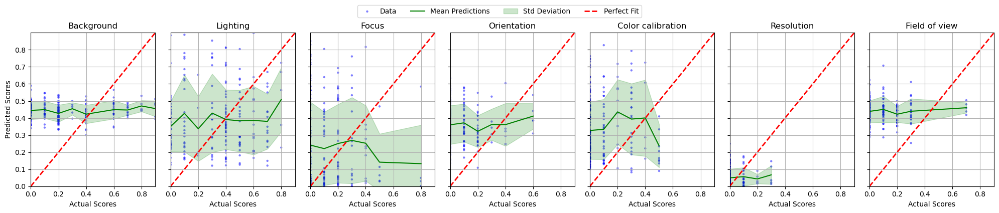


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     11.02      |    19.67     |   0.0551   |   0.0356   |
     Lighting      |     12.89      |    17.92     |  -0.0104   |   0.0027   |
      Focus        |     22.36      |    19.09     |  -0.0606   |  -0.0289   |
   Orientation     |      5.84      |    29.17     |  -0.0491   |  -0.0672   |
Color calibration  |     17.87      |    13.63     |   0.0229   |   0.0540   |
    Resolution     |     49.43      |    48.68     |  -0.0173   |  -0.0173   |
  Field of view    |      8.33      |     5.00     |  -0.0129   |  -0.0532   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  1.0614   |   1.7943   |     22.82      |    20.53     |   0.1799   |   0.1845   |


In [32]:
with open("comb_mlp.pkl", "rb") as f:
    regressor = pickle.load(f)

test('to_label', crop=False, batch_size=10, num_workers=1, model=regressor, model_type='reg')

Loaded features from to_label/embeddings/features.npy
Loaded scores from to_label/embeddings/scores.npy


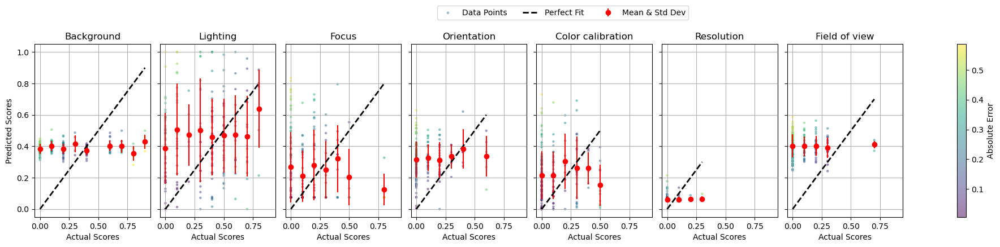


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |      9.89      |    19.22     |   0.0223   |   0.0214   |
     Lighting      |     19.47      |    17.05     |   0.0470   |   0.0413   |
      Focus        |     23.31      |    21.73     |  -0.0270   |   0.0155   |
   Orientation     |     22.69      |    24.11     |  -0.0000   |   0.0195   |
Color calibration  |     24.38      |    21.56     |   0.0499   |   0.0728   |
    Resolution     |     47.42      |    48.42     |  -0.0403   |  -0.0403   |
  Field of view    |      6.62      |     9.00     |   0.0191   |  -0.0024   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.9521   |   1.5893   |     24.12      |    22.75     |   0.2500   |   0.2493   |


In [10]:
from test import test
import pickle
with open("comb_mlp.pkl", "rb") as f:
    mlp = pickle.load(f)

test('to_label', crop=False, batch_size=10, num_workers=1, model=mlp, model_type='mlp')

Loaded features from to_label/embeddings/features.npy
Loaded scores from to_label/embeddings/scores.npy


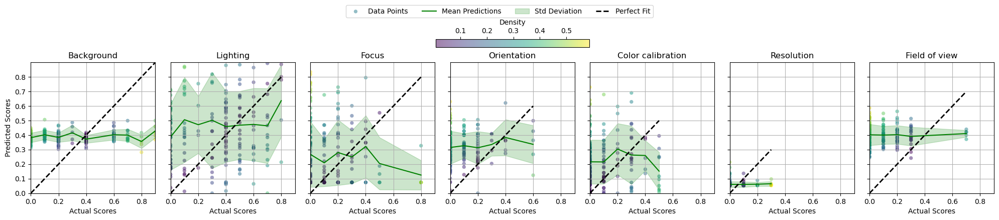


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |      9.89      |    19.22     |   0.0223   |   0.0214   |
     Lighting      |     19.47      |    17.05     |   0.0470   |   0.0413   |
      Focus        |     23.31      |    21.73     |  -0.0270   |   0.0155   |
   Orientation     |     22.69      |    24.11     |  -0.0000   |   0.0195   |
Color calibration  |     24.38      |    21.56     |   0.0499   |   0.0728   |
    Resolution     |     47.42      |    48.42     |  -0.0403   |  -0.0403   |
  Field of view    |      6.62      |     9.00     |   0.0191   |  -0.0024   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.9521   |   1.5893   |     24.12      |    22.75     |   0.2500   |   0.2493   |


In [22]:
test('to_label', crop=False, batch_size=10, num_workers=1, model=mlp, model_type='mlp')

Loaded features from to_label/embeddings/features.npy
Loaded scores from to_label/embeddings/scores.npy


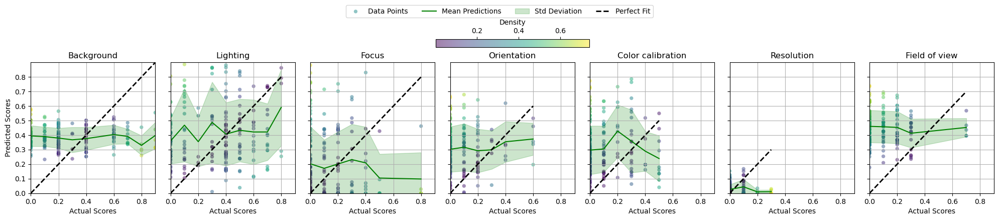


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     11.56      |    22.11     |  -0.0316   |  -0.0210   |
     Lighting      |     21.41      |    22.19     |   0.0535   |   0.0631   |
      Focus        |     18.69      |    17.34     |  -0.0237   |   0.0069   |
   Orientation     |     26.96      |    25.62     |   0.0281   |   0.0177   |
Color calibration  |     23.92      |    18.74     |   0.0269   |   0.0602   |
    Resolution     |     47.44      |    48.68     |  -0.0367   |  -0.0367   |
  Field of view    |      7.41      |     8.00     |  -0.0373   |  -0.0697   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.9771   |   1.6914   |     24.74      |    24.26     |   0.1887   |   0.1997   |


In [8]:
from test import test
test('to_label', crop=False, batch_size=10, num_workers=1, model=regressor, model_type='reg')

Loaded features from to_label/embeddings/features.npy
Loaded scores from to_label/embeddings/scores.npy


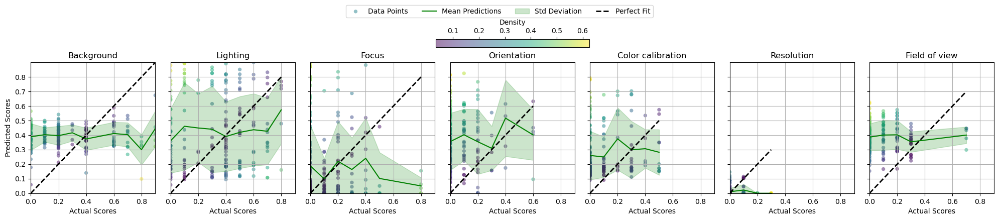


     Criteria      | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
------------------------------------------------------------------------------
    Background     |     19.60      |    18.27     |  -0.0523   |  -0.0636   |
     Lighting      |     23.66      |    21.99     |   0.0415   |   0.0525   |
      Focus        |     22.07      |    20.98     |   0.0307   |   0.0734   |
   Orientation     |     19.69      |    20.67     |   0.0798   |   0.0372   |
Color calibration  |     29.08      |    24.11     |   0.0974   |   0.1210   |
    Resolution     |     47.49      |    49.74     |  -0.0163   |  -0.0163   |
  Field of view    |      6.53      |    11.50     |   0.0370   |   0.0082   |

   MAE     |    MSE     | Precision (%)  |  Recall (%)  |    PLCC    |    SRCC    |
-----------------------------------------------------------------------------------
  0.9679   |   1.6821   |     24.33      |    23.95     |   0.2002   |   0.2096   |


In [6]:
from test import test
test('to_label', crop=False, batch_size=10, num_workers=1, model=mlp, model_type='mlp')

Loaded features from test/embeddings/features.npy
Loaded scores from test/embeddings/scores.npy


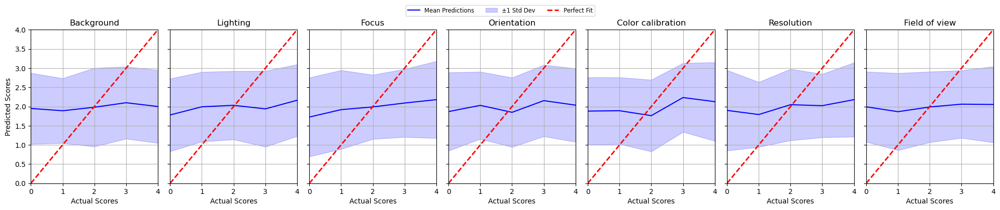


     Criteria      |    MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
----------------------------------------------------------------------------
    Background     |   1.2429   |  -0.0457   |   0.1646   |     0.0902     |
     Lighting      |   0.6571   |   0.5345   |   0.7310   |     0.6935     |
      Focus        |   0.5143   |   0.6100   |   0.7817   |     0.8050     |
   Orientation     |   0.8714   |   0.3356   |   0.5971   |     0.4522     |
Color calibration  |   0.5143   |   0.7152   |   0.8480   |     0.8202     |
    Resolution     |   0.4143   |   0.7226   |   0.8456   |     0.8382     |
  Field of view    |   1.1857   |  -0.0994   |  -0.0144   |    -0.0040     |

   MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
-------------------------------------------------------
  0.7714   |   0.4054   |   0.6299   |     0.5921     |


In [6]:
import pickle
from test import test
with open("combined_mlp.pkl", "rb") as f:
    mlp = pickle.load(f)
test('test_70', crop=False, batch_size=10, num_workers=1, model=mlp, model_type='mlp')

Loaded features from test_70/embeddings/features.npy
Loaded scores from test_70/embeddings/scores.npy


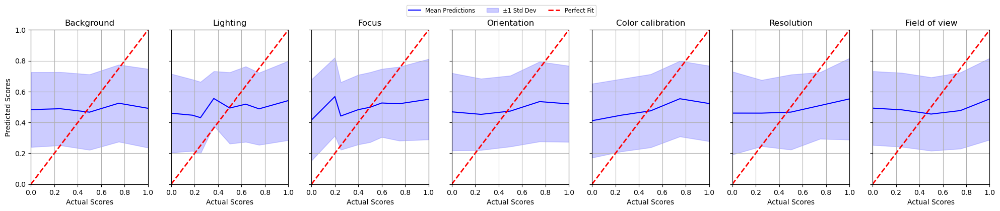


     Criteria      |    MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
----------------------------------------------------------------------------
    Background     |   1.2143   |   0.0800   |   0.2877   |     0.2731     |
     Lighting      |   0.6857   |   0.5674   |   0.7536   |     0.7464     |
      Focus        |   0.4286   |   0.7165   |   0.7999   |     0.8435     |
   Orientation     |   1.0143   |   0.2495   |   0.5262   |     0.4234     |
Color calibration  |   0.4429   |   0.7573   |   0.8743   |     0.8679     |
    Resolution     |   0.3714   |   0.7753   |   0.8844   |     0.8782     |
  Field of view    |   1.1286   |   0.0305   |   0.2238   |     0.1287     |

   MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
-------------------------------------------------------
  0.7551   |   0.4637   |   0.6700   |     0.6524     |


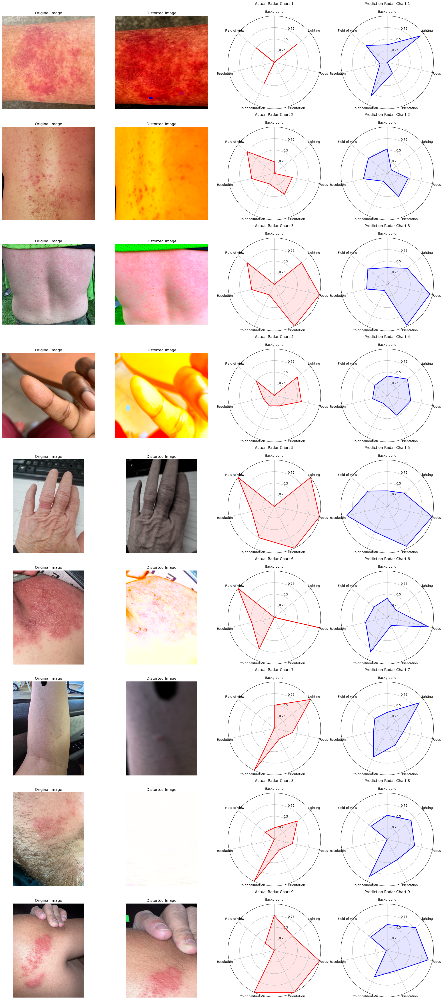

In [9]:
from test import test
test('test_70', crop=False, batch_size=10, num_workers=1, model=mlp, model_type='mlp')

Loaded features from test_200/embeddings/features.npy
Loaded scores from test_200/embeddings/scores.npy


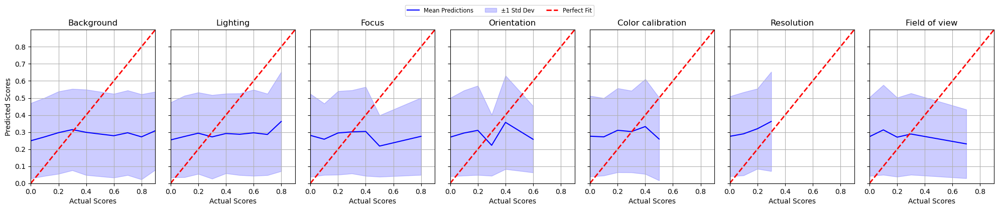


     Criteria      |    MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
----------------------------------------------------------------------------
    Background     |   0.9100   |  -0.1346   |   0.0685   |     0.0594     |
     Lighting      |   1.2500   |  -1.2194   |   0.0199   |     0.0088     |
      Focus        |   0.7050   |  -1.5939   |   0.0679   |     0.0090     |
   Orientation     |   1.2050   |  -7.1913   |   0.0387   |     0.0238     |
Color calibration  |   0.9700   |  -2.6944   |   0.0954   |     0.0486     |
    Resolution     |   0.0600   |  -0.2632   |  -0.0231   |    -0.0169     |
  Field of view    |   1.6900   |  -8.4213   |   0.0117   |     0.0075     |

   MAE     |    R^2     |    SRCC    |  Cohens Kappa  |
-------------------------------------------------------
  0.9700   |  -1.4278   |   0.1707   |     0.1300     |


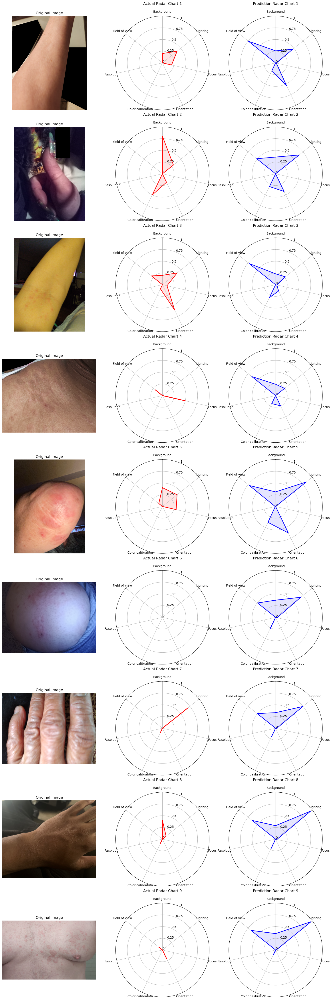

In [10]:
from test import test
test('test_200', crop=False, batch_size=10, num_workers=1, model=mlp, model_type='mlp')

# Single image inference

Using cache found in /home/jovyan/.cache/torch/hub/miccunifi_ARNIQA_main
/opt/conda/lib/python3.11/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


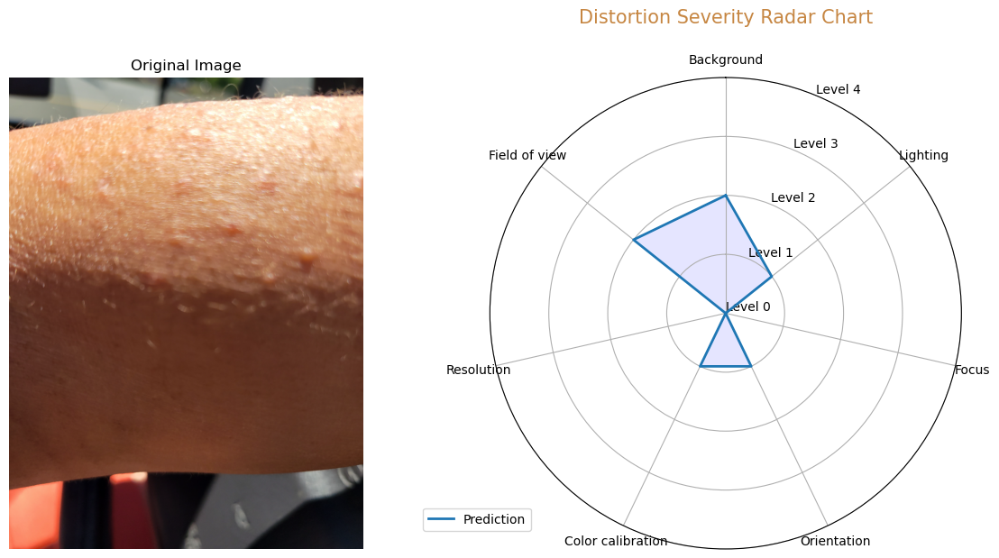

In [33]:
import torch
import pickle
from single_image_inference import test_single_image

image_path = "2.png"

#with open("regressor1.pkl", "rb") as f:
    #regressor = pickle.load(f)

test_single_image(image_path, crop=False, model=regressor, model_type='reg')

Using cache found in /home/jovyan/.cache/torch/hub/miccunifi_ARNIQA_main


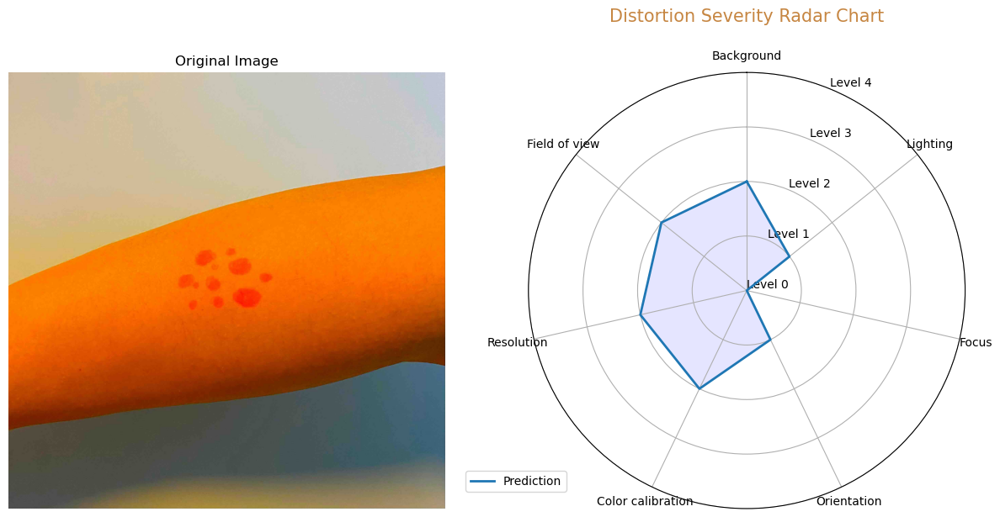

In [40]:
image_path = "temp/Color.jpg"
test_single_image(image_path, crop=False, model=mlp, model_type='mlp')

Using cache found in /home/jovyan/.cache/torch/hub/miccunifi_ARNIQA_main


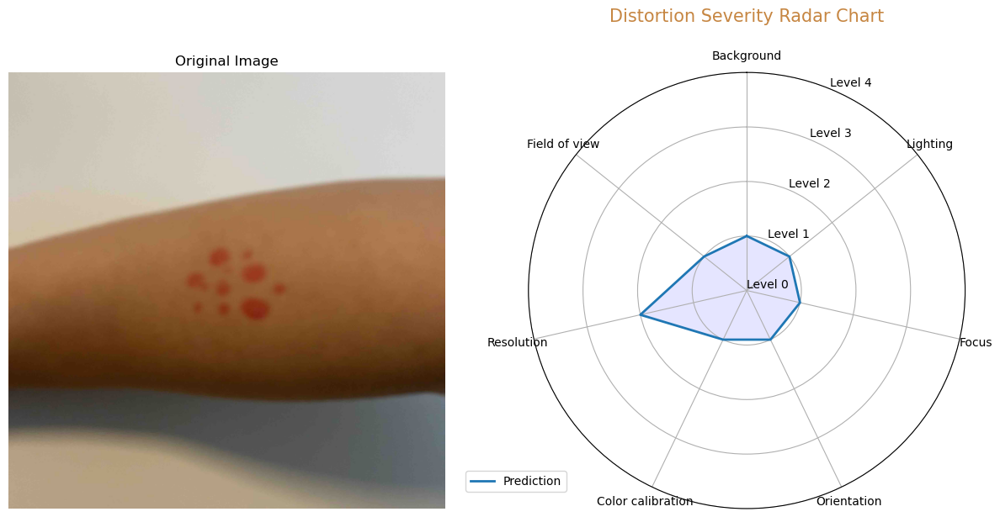

In [41]:
image_path = "temp/Focus.jpg"
test_single_image(image_path, crop=False, model=mlp, model_type='mlp')

Using cache found in /home/jovyan/.cache/torch/hub/miccunifi_ARNIQA_main


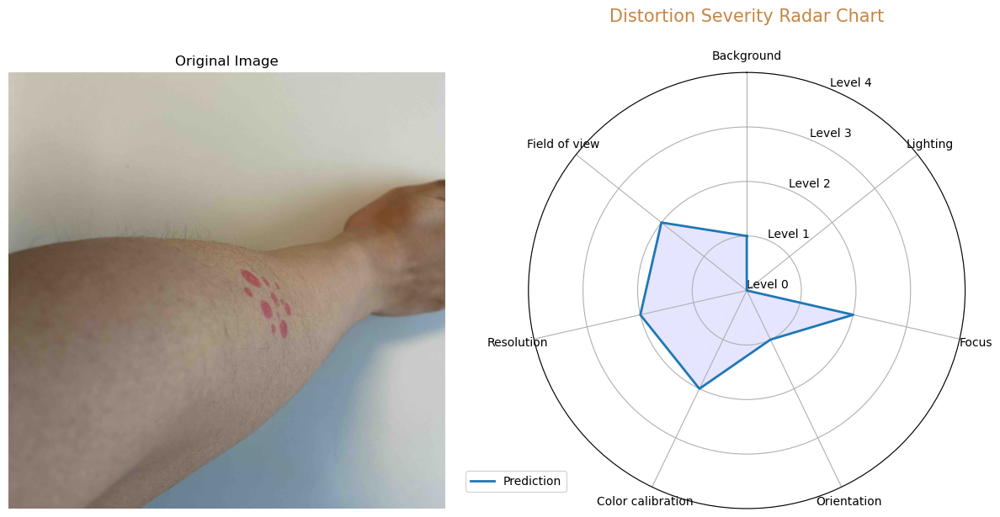

In [42]:
image_path = "temp/Orientation.jpg"
test_single_image(image_path, crop=False, model=mlp, model_type='mlp')

Using cache found in /home/jovyan/.cache/torch/hub/miccunifi_ARNIQA_main


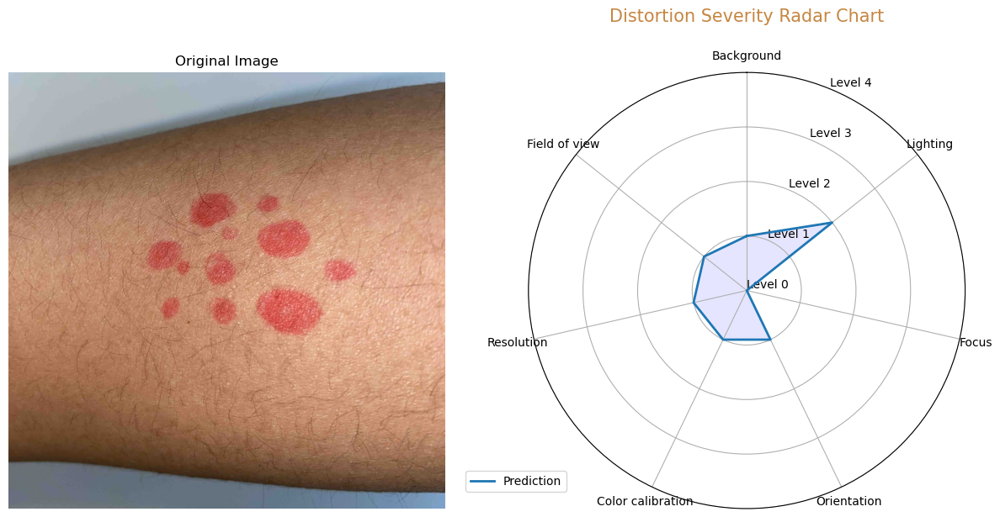

In [43]:
image_path = "temp/Reference.jpg"
test_single_image(image_path, crop=False, model=mlp, model_type='mlp')

Using cache found in /home/jovyan/.cache/torch/hub/miccunifi_ARNIQA_main


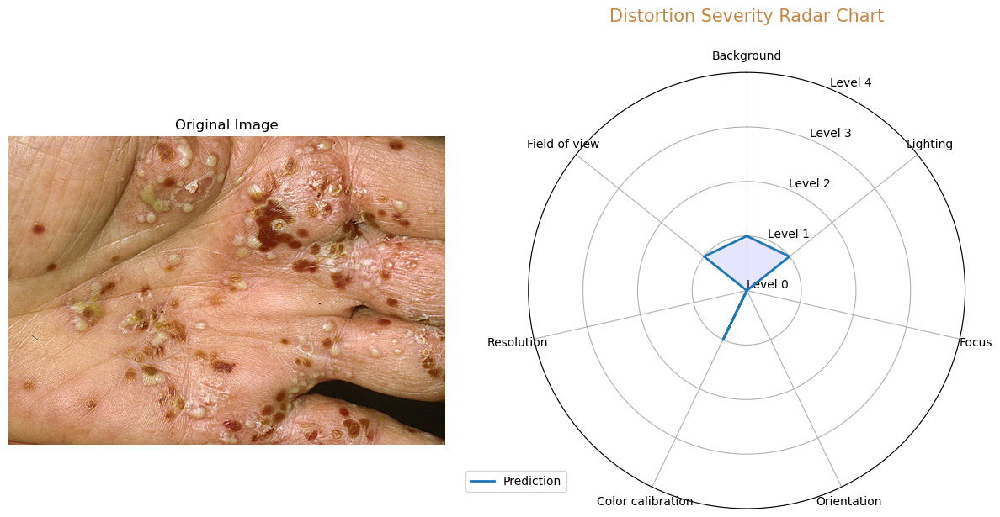

In [39]:
image_path = "1.jpg"
test_single_image(image_path, crop=False, model=mlp, model_type='mlp')

# Sweep many num distortions

In [7]:
import wandb
from train_num_distortions import train

# Combined xgb reg
sweep_config = {
    'method': 'random',
    'metric': {'name': 'overall_srocc', 'goal': 'maximize'},
    'parameters': {
        'root': {'value': 'combined'},
        'model_type': {'value': 'xgb_reg'},
        'crop': {'value': False},
        'batch_size': {'value': 10},
        'num_distortions': {'values': [2, 1]}, # [2, 8, 16] [4, 16, 32], [4, 16, 64]
        
        'n_estimators': {'values': [50, 100, 200, 300]}, # [50, 100, 200, 300]
        'learning_rate': {"min": 0.0001, "max": 0.1},
        'min_child_weight': {"min": 1, "max": 150},
        'early_stopping_rounds': {"values": [10, 20, 30, 40]},
        'subsample': {"values": [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
        'max_depth': {"values": [3, 5, 7, 9]},
        'gamma': {"min": 0.001, "max": 0.5},
        'multi_strategy': {"values": ["one_output_per_tree", "multi_output_tree"]},
    }
}
sweep_id = wandb.sweep(sweep_config, project="BAA", entity="choekyel-hslu")
wandb.agent(sweep_id, train, count=2)
wandb.finish()

Create sweep with ID: oedhzqvb
Sweep URL: https://wandb.ai/choekyel-hslu/BAA/sweeps/oedhzqvb


wandb: Agent Starting Run: h0ix22zx with config:
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 10
wandb: 	gamma: 0.09033963276636112
wandb: 	learning_rate: 0.08177755072762045
wandb: 	max_depth: 9
wandb: 	min_child_weight: 45
wandb: 	model_type: xgb_cls
wandb: 	multi_strategy: multi_output_tree
wandb: 	n_estimators: 200
wandb: 	num_distortions: 2
wandb: 	root: combined
wandb: 	subsample: 0.7


Loaded features from combined/embeddings/features_2.npy
Loaded scores from combined/embeddings/scores_2.npy


best_iteration,▁▆▅▁▅█▃
best_score,▁▆▇▁▄█▃
epoch,▁▂▂▂▂▃▄▄▅▆▇▂▂▃▄▄▅▆▁▁▂▃▃▄▅▁▂▃▃▄▅▅▆▇▇█▁▂▃▄
overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁


wandb: Agent Starting Run: v7jl1wzq with config:
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 20
wandb: 	gamma: 0.3847009884180469
wandb: 	learning_rate: 0.06092095935959863
wandb: 	max_depth: 3
wandb: 	min_child_weight: 123
wandb: 	model_type: xgb_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 200
wandb: 	num_distortions: 1
wandb: 	root: combined
wandb: 	subsample: 1


Loaded features from combined/embeddings/features_1.npy
Loaded scores from combined/embeddings/scores_1.npy


/opt/conda/lib/python3.11/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


best_iteration,▁▅█▁▁▁▁
best_score,▁▅█▁▁▁▁
epoch,▁▂▂▃▄▁▂▃▄▅▅▆▁▂▃▃▄▅▆▆▇█▁▂▃▃▁▂▃▃▄▁▂▃▄▁▂▃▃▄
overall_srocc,▁
srocc_Focus,▁
validation_0-auc,▁▁▁▁▁▁▄▅▅▄▅▅▁▁▇███████▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
validation_0-merror,▇▇▇▇▇▁▁▁▁▂▂▁▄▄▄▄▄▃▃▃▃▄█████████▆▆▆▆▆▆▆▆▆
validation_0-mlogloss,▇▇███▆▄▃▂▂▁▁▇▇▅▄▃▂▂▂▁▁▇▇▇▇▇████▇▇▇█▇▇▇▇▇
best_iteration,0
best_score,0.5
epoch,20


In [4]:
import wandb
from train_num_distortions import train

sweep_config = {
    "method": "random",
    "metric": {"name": "overall_srocc", "goal": "maximize"},
    "parameters": {
        'root': {'value': 'combined'},
        'model_type': {'value': 'mlp_cls'},
        'crop': {'value': False},
        'batch_size': {'value': 10},
        'num_distortions': {'values': [2, 1]}, # [2, 8, 16] [4, 16, 32]
        
        "hidden_layer_sizes": {
            "values": [(512,), (1024,), (512, 256), (1024, 512), (512, 512)]
        },
        "activation": {"value": "relu"},
        "alpha": {"min": 0.0001, "max": 0.01},
        "learning_rate_init": {"min": 0.0001, "max": 0.1},
        "max_iter": {"values": [200, 300, 500]} # [300, 500, 700]
    }
}

sweep_id = wandb.sweep(sweep_config, project="BAA", entity="choekyel-hslu")
wandb.agent(sweep_id, train, count=2)
wandb.finish()

Create sweep with ID: 724c9aa1
Sweep URL: https://wandb.ai/choekyel-hslu/BAA/sweeps/724c9aa1


wandb: Agent Starting Run: 14911a1z with config:
wandb: 	activation: relu
wandb: 	alpha: 0.003071848977611714
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	hidden_layer_sizes: [1024]
wandb: 	learning_rate_init: 0.038384781409207654
wandb: 	max_iter: 500
wandb: 	model_type: mlp_cls
wandb: 	num_distortions: 1
wandb: 	root: combined


Loaded features from combined/embeddings/features_1.npy
Loaded scores from combined/embeddings/scores_1.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.32374
srocc_Background,0.21897
srocc_Color Calibration,0.58392


wandb: Agent Starting Run: 1esj4fyj with config:
wandb: 	activation: relu
wandb: 	alpha: 0.00522303768212176
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	hidden_layer_sizes: [1024]
wandb: 	learning_rate_init: 0.046071268445476966
wandb: 	max_iter: 500
wandb: 	model_type: mlp_cls
wandb: 	num_distortions: 1
wandb: 	root: combined


Loaded features from combined/embeddings/features_1.npy
Loaded scores from combined/embeddings/scores_1.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.29253
srocc_Background,0.13494
srocc_Color Calibration,0.43866


In [ ]:
import wandb
from train_num_distortions import train

sweep_config = {
    'method': 'random',
    'metric': {'name': 'overall_srocc', 'goal': 'maximize'},
    'parameters': {
        'root': {'value': 'combined'},
        'model_type': {'value': 'reg'},
        'crop': {'value': False},
        'batch_size': {'value': 10},
        'num_distortions': {'values': [10, 20, 30]}, # [2, 8, 16] [4, 16, 32]
        
        'n_estimators': {'values': [50, 100, 200, 300]}, # [50, 100, 200, 300]
        "learning_rate": {"min": 0.0001, "max": 0.1},
        "min_child_weight": {"min": 1, "max": 150},
        "early_stopping_rounds": {"values": [10, 20, 30]},
        "subsample": {"values": [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
        "max_depth": {"values": [3, 5, 7, 9]},
        "gamma": {"min": 0.001, "max": 0.5},
    }
}

sweep_id = wandb.sweep(sweep_config, project="BAA", entity="choekyel-hslu")
wandb.agent(sweep_id, train, count=50)
wandb.finish()

Create sweep with ID: 218wg9kf
Sweep URL: https://wandb.ai/choekyel-hslu/BAA/sweeps/218wg9kf


wandb: Agent Starting Run: 6jtqtwbz with config:
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 30
wandb: 	gamma: 0.35163286413289657
wandb: 	learning_rate: 0.04004744429493377
wandb: 	max_depth: 3
wandb: 	min_child_weight: 77
wandb: 	model_type: reg
wandb: 	n_estimators: 50
wandb: 	num_distortions: 10
wandb: 	root: combined
wandb: 	subsample: 0.5
wandb: Currently logged in as: choekyel-hslu. Use `wandb login --relogin` to force relogin


Using cache found in /home/jovyan/.cache/torch/hub/miccunifi_ARNIQA_main


Saved features to combined/embeddings/features_10.npy
Saved scores to combined/embeddings/scores_10.npy
Training for criteria: Background
Training for criteria: Lighting
Training for criteria: Focus
Training for criteria: Orientation
Training for criteria: Color Calibration
Training for criteria: Resolution
Training for criteria: Field of View


best_iteration,▁▁▁▁▁▁▁
best_score,█▄▂█▂▁▆
epoch,▁▂▄▅▆█▂▃▄▅▇█▂▃▄▆▇▁▂▃▅▆▇▁▂▄▅▇█▂▃▅▆▇█▂▄▅▆█
mean_spearman,▁
overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁


wandb: Agent Starting Run: 8estiq6d with config:
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 20
wandb: 	gamma: 0.299043170673494
wandb: 	learning_rate: 0.025941302448751254
wandb: 	max_depth: 7
wandb: 	min_child_weight: 25
wandb: 	model_type: reg
wandb: 	n_estimators: 50
wandb: 	num_distortions: 20
wandb: 	root: combined
wandb: 	subsample: 0.7


Using cache found in /home/jovyan/.cache/torch/hub/miccunifi_ARNIQA_main


Saved features to combined/embeddings/features_20.npy
Saved scores to combined/embeddings/scores_20.npy
Training for criteria: Background
Training for criteria: Lighting
Training for criteria: Focus
Training for criteria: Orientation
Training for criteria: Color Calibration
Training for criteria: Resolution
Training for criteria: Field of View


best_iteration,▁▁▁▁▁▁▁
best_score,█▄▂█▂▁▆
epoch,▁▂▄▅▆█▂▃▄▅▇█▂▃▄▆▇▁▂▃▅▆▇▁▂▄▅▇█▂▃▅▆▇█▂▄▅▆█
mean_spearman,▁
overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁


wandb: Agent Starting Run: poreekpi with config:
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 30
wandb: 	gamma: 0.08218971342176902
wandb: 	learning_rate: 0.09304104130471792
wandb: 	max_depth: 3
wandb: 	min_child_weight: 75
wandb: 	model_type: reg
wandb: 	n_estimators: 300
wandb: 	num_distortions: 30
wandb: 	root: combined
wandb: 	subsample: 0.6


Using cache found in /home/jovyan/.cache/torch/hub/miccunifi_ARNIQA_main
Extracting features:  96%|█████████▋| 2748/2850 [3:16:29<06:32,  3.85s/it]  

In [ ]:
what i found out is that the more images better the overall srocc score for xgb regressor and classifier. for my experiments i tried with [4, 8, 16, 32, 64] times the training set of 475 or [4, 8, 16, 32] for the combined dataset of 950. 

# Sweep Combined

In [ ]:
import wandb
from train_num_distortions import train

sweep_config = {
    'method': 'random',
    'metric': {'name': 'overall_srocc', 'goal': 'maximize'},
    'parameters': {
        'root': {'value': 'combined'},
        'model_type': {'values': ['xgb_cls', 'mlp_cls']}, # 'model_type': {'values': ['xgb_reg', 'xgb_cls', 'mlp_reg', 'mlp_cls']},
        'crop': {'value': False},
        'batch_size': {'value': 10},
        'num_distortions': {'values': [4, 16, 64]}, # [2, 8, 16] [4, 16, 32], [4, 16, 64]
        
        'n_estimators': {'values': [50, 100, 200, 300]},
        'learning_rate': {"min": 0.0001, "max": 0.1},
        'min_child_weight': {"min": 1, "max": 150},
        'early_stopping_rounds': {"values": [10, 20, 30, 40]},
        'subsample': {"values": [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]},
        'max_depth': {"values": [3, 5, 7, 9]},
        'gamma': {"min": 0.001, "max": 0.5},
        'multi_strategy': {"values": ["one_output_per_tree", "multi_output_tree"]},
        "hidden_layer_sizes": {
            "values": [(512,), (1024,), (512, 256), (1024, 512), (512, 512)]
        },
        "activation": {"value": "relu"},
        "alpha": {"min": 0.0001, "max": 0.01},
        "learning_rate_init": {"min": 0.0001, "max": 0.1},
        "max_iter": {"values": [200, 300, 500]},
    }
}
sweep_id = wandb.sweep(sweep_config, project="BAA", entity="choekyel-hslu")
wandb.agent(sweep_id, train, count=50)
wandb.finish()

Create sweep with ID: qb0qqn7r
Sweep URL: https://wandb.ai/choekyel-hslu/BAA/sweeps/qb0qqn7r


wandb: Agent Starting Run: ej76jhm3 with config:
wandb: 	activation: relu
wandb: 	alpha: 0.0019748229821280705
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 20
wandb: 	gamma: 0.3990625463068545
wandb: 	hidden_layer_sizes: [1024]
wandb: 	learning_rate: 0.08566914678510222
wandb: 	learning_rate_init: 0.04390116525386977
wandb: 	max_depth: 5
wandb: 	max_iter: 300
wandb: 	min_child_weight: 100
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: multi_output_tree
wandb: 	n_estimators: 200
wandb: 	num_distortions: 64
wandb: 	root: combined
wandb: 	subsample: 0.7
wandb: Currently logged in as: choekyel-hslu. Use `wandb login --relogin` to force relogin


Loaded features from combined/embeddings/features_64.npy
Loaded scores from combined/embeddings/scores_64.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.44229
srocc_Background,0.43449
srocc_Color Calibration,0.58164


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: e69u01u0 with config:
wandb: 	activation: relu
wandb: 	alpha: 0.0014901633373961029
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 30
wandb: 	gamma: 0.04758069734304663
wandb: 	hidden_layer_sizes: [1024]
wandb: 	learning_rate: 0.09428031963022328
wandb: 	learning_rate_init: 0.08480708098121638
wandb: 	max_depth: 7
wandb: 	max_iter: 200
wandb: 	min_child_weight: 58
wandb: 	model_type: xgb_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 300
wandb: 	num_distortions: 16
wandb: 	root: combined
wandb: 	subsample: 0.5


Loaded features from combined/embeddings/features_16.npy
Loaded scores from combined/embeddings/scores_16.npy


best_iteration,▁▄▇▄▆█▅
best_score,▃▆▇▁▆█▄
epoch,▁▂▃▂▃▄▅▆▂▃▄▅▆▇█▁▃▃▄▁▂▃▄▅▆▇▁▂▃▄▅▆▇█▁▂▃▄▅▆
overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁


wandb: Agent Starting Run: eb41welq with config:
wandb: 	activation: relu
wandb: 	alpha: 0.0012342725940891702
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 20
wandb: 	gamma: 0.4015317049088086
wandb: 	hidden_layer_sizes: [512, 256]
wandb: 	learning_rate: 0.015659654293979995
wandb: 	learning_rate_init: 0.08301854685386134
wandb: 	max_depth: 9
wandb: 	max_iter: 500
wandb: 	min_child_weight: 81
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: multi_output_tree
wandb: 	n_estimators: 200
wandb: 	num_distortions: 4
wandb: 	root: combined
wandb: 	subsample: 0.8


Loaded features from combined/embeddings/features_4.npy
Loaded scores from combined/embeddings/scores_4.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.37989
srocc_Background,0.41997
srocc_Color Calibration,0.49566


wandb: Agent Starting Run: fari6vcq with config:
wandb: 	activation: relu
wandb: 	alpha: 0.007656434645513462
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 20
wandb: 	gamma: 0.4083669076270565
wandb: 	hidden_layer_sizes: [512, 512]
wandb: 	learning_rate: 0.05266581072721263
wandb: 	learning_rate_init: 0.05203481800189429
wandb: 	max_depth: 5
wandb: 	max_iter: 200
wandb: 	min_child_weight: 42
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 200
wandb: 	num_distortions: 16
wandb: 	root: combined
wandb: 	subsample: 0.5


Loaded features from combined/embeddings/features_16.npy
Loaded scores from combined/embeddings/scores_16.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.38743
srocc_Background,0.38531
srocc_Color Calibration,0.66541


wandb: Agent Starting Run: 1sz0l8el with config:
wandb: 	activation: relu
wandb: 	alpha: 0.0013825196046476573
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 10
wandb: 	gamma: 0.35357772712830643
wandb: 	hidden_layer_sizes: [1024]
wandb: 	learning_rate: 0.05858650913311199
wandb: 	learning_rate_init: 0.09145578366916582
wandb: 	max_depth: 9
wandb: 	max_iter: 500
wandb: 	min_child_weight: 78
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: multi_output_tree
wandb: 	n_estimators: 100
wandb: 	num_distortions: 64
wandb: 	root: combined
wandb: 	subsample: 0.6


Loaded features from combined/embeddings/features_64.npy
Loaded scores from combined/embeddings/scores_64.npy


/opt/conda/lib/python3.11/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Resolution,▁
overall_srocc,0.4128
srocc_Background,0.43046
srocc_Color Calibration,0.58697
srocc_Field of View,0.3168


wandb: Agent Starting Run: h5r5kynz with config:
wandb: 	activation: relu
wandb: 	alpha: 0.0021290725658628324
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 10
wandb: 	gamma: 0.2852045299644574
wandb: 	hidden_layer_sizes: [512]
wandb: 	learning_rate: 0.0028445054630508904
wandb: 	learning_rate_init: 0.0541934075508901
wandb: 	max_depth: 5
wandb: 	max_iter: 300
wandb: 	min_child_weight: 50
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 100
wandb: 	num_distortions: 16
wandb: 	root: combined
wandb: 	subsample: 0.5


Loaded features from combined/embeddings/features_16.npy
Loaded scores from combined/embeddings/scores_16.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.41547
srocc_Background,0.39664
srocc_Color Calibration,0.58251


wandb: Agent Starting Run: s1rwu8dn with config:
wandb: 	activation: relu
wandb: 	alpha: 0.0054389587635940515
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 30
wandb: 	gamma: 0.3458347035364469
wandb: 	hidden_layer_sizes: [1024]
wandb: 	learning_rate: 0.0757845775652131
wandb: 	learning_rate_init: 0.07837432421563219
wandb: 	max_depth: 9
wandb: 	max_iter: 300
wandb: 	min_child_weight: 92
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: multi_output_tree
wandb: 	n_estimators: 300
wandb: 	num_distortions: 16
wandb: 	root: combined
wandb: 	subsample: 0.7


Loaded features from combined/embeddings/features_16.npy
Loaded scores from combined/embeddings/scores_16.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.37837
srocc_Background,0.40207
srocc_Color Calibration,0.40971


wandb: Agent Starting Run: dx7lt24r with config:
wandb: 	activation: relu
wandb: 	alpha: 0.002309338551438351
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 10
wandb: 	gamma: 0.03335578182707923
wandb: 	hidden_layer_sizes: [512, 256]
wandb: 	learning_rate: 0.0006696402593682569
wandb: 	learning_rate_init: 0.04313589887576889
wandb: 	max_depth: 9
wandb: 	max_iter: 500
wandb: 	min_child_weight: 24
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 300
wandb: 	num_distortions: 4
wandb: 	root: combined
wandb: 	subsample: 0.5


Loaded features from combined/embeddings/features_4.npy
Loaded scores from combined/embeddings/scores_4.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.418
srocc_Background,0.37663
srocc_Color Calibration,0.61952


wandb: Agent Starting Run: yiv5lq96 with config:
wandb: 	activation: relu
wandb: 	alpha: 0.0033992897451142214
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 40
wandb: 	gamma: 0.3654598663270384
wandb: 	hidden_layer_sizes: [512, 512]
wandb: 	learning_rate: 0.09476403594463456
wandb: 	learning_rate_init: 0.06356996790371357
wandb: 	max_depth: 3
wandb: 	max_iter: 500
wandb: 	min_child_weight: 64
wandb: 	model_type: xgb_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 200
wandb: 	num_distortions: 64
wandb: 	root: combined
wandb: 	subsample: 0.6


Loaded features from combined/embeddings/features_64.npy
Loaded scores from combined/embeddings/scores_64.npy


best_iteration,███▁███
best_score,▃▆▇▁▆█▄
epoch,▁▂▄▅▆█▂▃▄▅▇█▂▃▄▆▇▁▂▃▅▆▇▁▂▄▅▇█▂▃▅▆▇█▂▄▅▆█
overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁


wandb: Agent Starting Run: 5rk10diz with config:
wandb: 	activation: relu
wandb: 	alpha: 0.0027095554469216236
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 10
wandb: 	gamma: 0.32203894247258597
wandb: 	hidden_layer_sizes: [1024]
wandb: 	learning_rate: 0.020451808928361685
wandb: 	learning_rate_init: 0.055993779753580865
wandb: 	max_depth: 7
wandb: 	max_iter: 500
wandb: 	min_child_weight: 112
wandb: 	model_type: xgb_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 50
wandb: 	num_distortions: 64
wandb: 	root: combined
wandb: 	subsample: 0.8


Loaded features from combined/embeddings/features_64.npy
Loaded scores from combined/embeddings/scores_64.npy


best_iteration,▁▁▁▁▁▁▁
best_score,▃▆▇▁▆█▄
epoch,▁▂▄▅▆█▂▃▄▅▇█▂▃▄▆▇▁▂▃▅▆▇▁▂▄▅▇█▂▃▅▆▇█▂▄▅▆█
overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁


wandb: Agent Starting Run: fkgl62hw with config:
wandb: 	activation: relu
wandb: 	alpha: 0.0014913724815504494
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 40
wandb: 	gamma: 0.13231329386391122
wandb: 	hidden_layer_sizes: [512, 256]
wandb: 	learning_rate: 0.02845968406345953
wandb: 	learning_rate_init: 0.08867968150841746
wandb: 	max_depth: 9
wandb: 	max_iter: 500
wandb: 	min_child_weight: 14
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 50
wandb: 	num_distortions: 16
wandb: 	root: combined
wandb: 	subsample: 0.7


Loaded features from combined/embeddings/features_16.npy
Loaded scores from combined/embeddings/scores_16.npy


/opt/conda/lib/python3.11/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Resolution,▁
overall_srocc,0.28202
srocc_Background,0.43479
srocc_Color Calibration,0.69821
srocc_Field of View,0.21262
srocc_Focus,0.60027


wandb: Sweep Agent: Waiting for job.
wandb: Job received.
wandb: Agent Starting Run: 6j0sfz4b with config:
wandb: 	activation: relu
wandb: 	alpha: 0.007427424542631086
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 40
wandb: 	gamma: 0.022990303618761677
wandb: 	hidden_layer_sizes: [512, 512]
wandb: 	learning_rate: 0.06754597933443324
wandb: 	learning_rate_init: 0.055817571029433896
wandb: 	max_depth: 5
wandb: 	max_iter: 500
wandb: 	min_child_weight: 71
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: multi_output_tree
wandb: 	n_estimators: 100
wandb: 	num_distortions: 16
wandb: 	root: combined
wandb: 	subsample: 0.9


Loaded features from combined/embeddings/features_16.npy
Loaded scores from combined/embeddings/scores_16.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.39509
srocc_Background,0.4224
srocc_Color Calibration,0.47082


wandb: Agent Starting Run: 0s4uuvc1 with config:
wandb: 	activation: relu
wandb: 	alpha: 0.00254428367670579
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 30
wandb: 	gamma: 0.10338090989068216
wandb: 	hidden_layer_sizes: [1024]
wandb: 	learning_rate: 0.04437501795603865
wandb: 	learning_rate_init: 0.013455647484262413
wandb: 	max_depth: 5
wandb: 	max_iter: 500
wandb: 	min_child_weight: 62
wandb: 	model_type: xgb_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 100
wandb: 	num_distortions: 64
wandb: 	root: combined
wandb: 	subsample: 0.7


Loaded features from combined/embeddings/features_64.npy
Loaded scores from combined/embeddings/scores_64.npy


best_iteration,▁▁▁▁▁▁▁
best_score,▃▆▇▁▆█▄
epoch,▁▂▄▅▆█▂▃▄▅▇█▂▃▄▆▇▁▂▃▅▆▇▁▂▄▅▇█▂▃▅▆▇█▂▄▅▆█
overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁


wandb: Agent Starting Run: fky9u7ex with config:
wandb: 	activation: relu
wandb: 	alpha: 0.003557440200277944
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 30
wandb: 	gamma: 0.48987086651129047
wandb: 	hidden_layer_sizes: [1024]
wandb: 	learning_rate: 0.02959727055635183
wandb: 	learning_rate_init: 0.036259944764318486
wandb: 	max_depth: 5
wandb: 	max_iter: 300
wandb: 	min_child_weight: 147
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: multi_output_tree
wandb: 	n_estimators: 200
wandb: 	num_distortions: 4
wandb: 	root: combined
wandb: 	subsample: 0.7


Loaded features from combined/embeddings/features_4.npy
Loaded scores from combined/embeddings/scores_4.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.36927
srocc_Background,0.36534
srocc_Color Calibration,0.43756


wandb: Agent Starting Run: yp8t6phx with config:
wandb: 	activation: relu
wandb: 	alpha: 0.005214342964637763
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 30
wandb: 	gamma: 0.3703905290596232
wandb: 	hidden_layer_sizes: [1024, 512]
wandb: 	learning_rate: 0.01295914575205508
wandb: 	learning_rate_init: 0.02745528162173725
wandb: 	max_depth: 9
wandb: 	max_iter: 300
wandb: 	min_child_weight: 33
wandb: 	model_type: xgb_cls
wandb: 	multi_strategy: multi_output_tree
wandb: 	n_estimators: 50
wandb: 	num_distortions: 64
wandb: 	root: combined
wandb: 	subsample: 0.5


Loaded features from combined/embeddings/features_64.npy
Loaded scores from combined/embeddings/scores_64.npy


best_iteration,▁▁▁▁▁▁▁
best_score,▃▆▇▁▆█▄
epoch,▁▂▄▅▆█▂▃▄▅▇█▂▃▄▆▇▁▂▃▅▆▇▁▂▄▅▇█▂▃▅▆▇█▂▄▅▆█
overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁


wandb: Agent Starting Run: dp8wgwtp with config:
wandb: 	activation: relu
wandb: 	alpha: 0.004095475116839274
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 20
wandb: 	gamma: 0.39363193523794926
wandb: 	hidden_layer_sizes: [1024, 512]
wandb: 	learning_rate: 0.0817670511090309
wandb: 	learning_rate_init: 0.06683626211801942
wandb: 	max_depth: 5
wandb: 	max_iter: 500
wandb: 	min_child_weight: 52
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 200
wandb: 	num_distortions: 64
wandb: 	root: combined
wandb: 	subsample: 0.8


Loaded features from combined/embeddings/features_64.npy
Loaded scores from combined/embeddings/scores_64.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.43996
srocc_Background,0.42271
srocc_Color Calibration,0.5158


wandb: Agent Starting Run: 7d72jrsk with config:
wandb: 	activation: relu
wandb: 	alpha: 0.006514362233195181
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 10
wandb: 	gamma: 0.18738444195551857
wandb: 	hidden_layer_sizes: [1024, 512]
wandb: 	learning_rate: 0.05110236598548354
wandb: 	learning_rate_init: 0.07251032594629947
wandb: 	max_depth: 7
wandb: 	max_iter: 300
wandb: 	min_child_weight: 74
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: multi_output_tree
wandb: 	n_estimators: 200
wandb: 	num_distortions: 4
wandb: 	root: combined
wandb: 	subsample: 0.6


Loaded features from combined/embeddings/features_4.npy
Loaded scores from combined/embeddings/scores_4.npy


/opt/conda/lib/python3.11/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


overall_srocc,▁
srocc_Focus,▁
srocc_Resolution,▁
overall_srocc,0.2366
srocc_Background,nan
srocc_Color Calibration,nan
srocc_Field of View,nan
srocc_Focus,0.63816
srocc_Lighting,nan
srocc_Orientation,nan
srocc_Resolution,0.55015


wandb: Agent Starting Run: j5d2o6qs with config:
wandb: 	activation: relu
wandb: 	alpha: 0.007729724504114011
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 10
wandb: 	gamma: 0.003663053778490881
wandb: 	hidden_layer_sizes: [512]
wandb: 	learning_rate: 0.022860492497749525
wandb: 	learning_rate_init: 0.04432945006777995
wandb: 	max_depth: 9
wandb: 	max_iter: 200
wandb: 	min_child_weight: 113
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 100
wandb: 	num_distortions: 64
wandb: 	root: combined
wandb: 	subsample: 0.9


Loaded features from combined/embeddings/features_64.npy
Loaded scores from combined/embeddings/scores_64.npy


overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.42962
srocc_Background,0.42468
srocc_Color Calibration,0.56821


wandb: Agent Starting Run: dxxssqkh with config:
wandb: 	activation: relu
wandb: 	alpha: 0.007602736033522597
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 30
wandb: 	gamma: 0.15593246483012244
wandb: 	hidden_layer_sizes: [512, 256]
wandb: 	learning_rate: 0.08086315329104339
wandb: 	learning_rate_init: 0.07376392760272973
wandb: 	max_depth: 3
wandb: 	max_iter: 200
wandb: 	min_child_weight: 33
wandb: 	model_type: mlp_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 50
wandb: 	num_distortions: 16
wandb: 	root: combined
wandb: 	subsample: 0.6


Loaded features from combined/embeddings/features_16.npy
Loaded scores from combined/embeddings/scores_16.npy


/opt/conda/lib/python3.11/site-packages/scipy/stats/_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


overall_srocc,▁
srocc_Background,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁
overall_srocc,0.34674
srocc_Background,0.41271
srocc_Color Calibration,nan
srocc_Field of View,0.21235


wandb: Agent Starting Run: kfgnolij with config:
wandb: 	activation: relu
wandb: 	alpha: 0.0047430240419601526
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 40
wandb: 	gamma: 0.3564213023692502
wandb: 	hidden_layer_sizes: [512]
wandb: 	learning_rate: 0.003964506563392157
wandb: 	learning_rate_init: 0.03527135883974964
wandb: 	max_depth: 7
wandb: 	max_iter: 200
wandb: 	min_child_weight: 150
wandb: 	model_type: xgb_cls
wandb: 	multi_strategy: one_output_per_tree
wandb: 	n_estimators: 50
wandb: 	num_distortions: 16
wandb: 	root: combined
wandb: 	subsample: 0.6


Loaded features from combined/embeddings/features_16.npy
Loaded scores from combined/embeddings/scores_16.npy


best_iteration,███▁▅██
best_score,▃▆▇▁▆█▄
epoch,▁▂▄▅▆█▂▃▄▅▇█▂▃▄▆▇▁▂▃▅▆▇▁▂▄▅▇█▂▃▅▆▇█▂▄▅▆█
overall_srocc,▁
srocc_Background,▁
srocc_Color Calibration,▁
srocc_Field of View,▁
srocc_Focus,▁
srocc_Lighting,▁
srocc_Orientation,▁
srocc_Resolution,▁


wandb: Agent Starting Run: oacyyafd with config:
wandb: 	activation: relu
wandb: 	alpha: 0.003659526799718342
wandb: 	batch_size: 10
wandb: 	crop: False
wandb: 	early_stopping_rounds: 30
wandb: 	gamma: 0.03217514914081136
wandb: 	hidden_layer_sizes: [512, 256]
wandb: 	learning_rate: 0.08808695270631212
wandb: 	learning_rate_init: 0.05846473434159633
wandb: 	max_depth: 9
wandb: 	max_iter: 500
wandb: 	min_child_weight: 102
wandb: 	model_type: xgb_cls
wandb: 	multi_strategy: multi_output_tree
wandb: 	n_estimators: 200
wandb: 	num_distortions: 64
wandb: 	root: combined
wandb: 	subsample: 0.7


Loaded features from combined/embeddings/features_64.npy
Loaded scores from combined/embeddings/scores_64.npy


wandb: Ctrl + C detected. Stopping sweep.
